In [2]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
import cv2
import numpy as np
import fitz
import io
from IPython.display import display
from PIL import Image as PILImage
def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    matches = []
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        matches.append((max_val, max_loc, extracted_image))

    # Sort matches by similarity score
    matches.sort(key=lambda x: x[0], reverse=True)

    # Display top matching results
    for match in matches:
        similarity_score, max_loc, matched_image = match
        print(f"Similarity score: {similarity_score}")
        cv2_imshow(matched_image)
        
        # Calculate position within PDF
        position_within_pdf = (max_loc[0], max_loc[1])  # Top-left corner of matched region
        
        # Adjust position based on the size of the extracted image
        extracted_height, extracted_width = matched_image.shape[:2]
        position_within_pdf = (position_within_pdf[0] + extracted_width // 2, position_within_pdf[1] + extracted_height // 2)
        print(f"Position within PDF: {position_within_pdf}")

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2E-MAP1B-Flag.tif'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images)

In [ ]:
def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    matches = []
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        matches.append((max_val, max_loc, extracted_image))

    # Sort matches by similarity score
    matches.sort(key=lambda x: x[0], reverse=True)

    # Display top matching results
    for match in matches:
        similarity_score, max_loc, matched_image = match
        print(f"Similarity score: {similarity_score}")
        cv2_imshow(matched_image)
        
        # Calculate position within PDF
        position_within_pdf = (max_loc[0], max_loc[1])  # Top-left corner of matched region
        
        # Adjust position based on the size of the extracted image
        extracted_height, extracted_width = matched_image.shape[:2]
        position_within_pdf = (position_within_pdf[0] + extracted_width // 2, position_within_pdf[1] + extracted_height // 2)
        print(f"Position within PDF: {position_within_pdf}")

# Example usage:
pdf_path = '/home/zahra/Documents/figure3.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3A-MAX_MAP1B-GOF.tif'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images)


In [6]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import io
import os
from IPython.display import display
from PIL import Image as PILImage  # Alias PIL Image to avoid naming conflict

def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def match_template_with_extracted_images(input_image_path, extracted_images, threshold):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    found_match = False
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        
        # Check if the similarity score exceeds the threshold
        if max_val >= threshold:
            print(f"Image {input_image_path} matches a figure in the PDF. Similarity score: {max_val}")
            found_match = True
            break

    # If no match found
    if not found_match:
        print(f"Image {input_image_path} does not match any figure in the PDF.")

def match_images_with_pdf(pdf_path, image_folder, threshold=0.8):
    extracted_images = extract_images_from_pdf(pdf_path)
    num_extracted_images = len(extracted_images)
    num_processed_tifs = 0
    
    # Iterate through images in the folder
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        
        # Check if the image is a multi-page TIFF
        if image_path.lower().endswith('.tif'):
            num_pages = get_num_tiff_pages(image_path)
            if num_pages > 1:
                print(f"Image {image_name} has {num_pages} pages. Skipping similarity calculation.")
                num_processed_tifs += 1
                continue
            else:
                num_processed_tifs += 1
        
        # Perform template matching
        try:
            match_template_with_extracted_images(image_path, extracted_images, threshold)
        except Exception as e:
            print(f"Error processing {image_name}: {str(e)}")
            continue

    num_missing_images = num_extracted_images - num_processed_tifs
    print(f"Number of images extracted from the PDF: {num_extracted_images}")
    print(f"Number of TIFF images processed from the source data: {num_processed_tifs}")
    print(f"Number of missing images: {num_missing_images}")

def get_num_tiff_pages(tiff_path):
    with PILImage.open(tiff_path) as img:
        num_pages = img.n_frames
    return num_pages

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
image_folder = '/home/zahra/Downloads/Figure2-source'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)


Image /home/zahra/Downloads/Figure2-source/Figure2C-MAP1BsgRNA.tif matches a figure in the PDF. Similarity score: 0.7661333084106445
Error processing Figure2.xlsx: Input image couldn't be loaded.
Image /home/zahra/Downloads/Figure2-source/Figure2E-control.tif matches a figure in the PDF. Similarity score: 0.9934828877449036
Image /home/zahra/Downloads/Figure2-source/Figure2C-control.tif matches a figure in the PDF. Similarity score: 0.8937474489212036
Image /home/zahra/Downloads/Figure2-source/Figure2A-control.tif matches a figure in the PDF. Similarity score: 0.9752476811408997
Image /home/zahra/Downloads/Figure2-source/Figure2E-C2-MAX.tif matches a figure in the PDF. Similarity score: 1.0
Image /home/zahra/Downloads/Figure2-source/Figure2A-MAP1BshRNA.tif matches a figure in the PDF. Similarity score: 0.9630962610244751
Image /home/zahra/Downloads/Figure2-source/Figure2E-C1-MAX.tif matches a figure in the PDF. Similarity score: 1.0
Image /home/zahra/Downloads/Figure2-source/Figure2E-M

In [5]:
# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)

Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3C-GSK3Btif.tif does not match any figure in the PDF.
Error processing Figure3.xlsx: Input image couldn't be loaded.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3A-MAX_MAP1B-P.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3C-GSK3B-MAP1B.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/C1-MAX_MAP1B-P-GFP.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3A-MAX_MAP1Bdephospho.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/C2-MAX_MAP1B-dP-Flag.tif does not match any figure

In [60]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import io
import os
from IPython.display import display
from PIL import Image as PILImage  # Alias PIL Image to avoid naming conflict

def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def match_template_with_extracted_images(input_image_path, extracted_images, threshold):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    found_match = False
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        
        # Check if the similarity score exceeds the threshold
        if max_val >= threshold:
            print(f"Image {input_image_path} matches a figure in the PDF. Similarity score: {max_val}")
            found_match = True
            break

    # If no match found
    if not found_match:
        print(f"Image {input_image_path} does not match any figure in the PDF.")

def match_images_with_pdf(pdf_path, image_folder, threshold=0.8):
    extracted_images = extract_images_from_pdf(pdf_path)
    num_extracted_images = len(extracted_images)
    num_processed_tifs = 0
    
    # Iterate through images in the folder
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        
        # Check if the image is a multi-page TIFF
        if image_path.lower().endswith('.tif'):
            num_pages = get_num_tiff_pages(image_path)
            if num_pages > 1:
                print(f"Image {image_name} has {num_pages} pages. Skipping similarity calculation.")
                num_processed_tifs += 1
                continue
            else:
                num_processed_tifs += 1
        
        # Perform template matching
        try:
            match_template_with_extracted_images(image_path, extracted_images, threshold)
        except Exception as e:
            print(f"Error processing {image_name}: {str(e)}")
            continue

    num_missing_images = num_extracted_images - num_processed_tifs
    print(f"Number of images extracted from the PDF: {num_extracted_images}")
    print(f"Number of TIFF images processed from the source data: {num_processed_tifs}")
    print(f"Number of missing images: {num_missing_images}")

def get_num_tiff_pages(tiff_path):
    with PILImage.open(tiff_path) as img:
        num_pages = img.n_frames
    return num_pages

# Example usage:
pdf_path = '/home/zahra/Documents/figure1.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)


Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files/Figure1A-single channel.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files/Figure1D-double KO.tif matches a figure in the PDF. Similarity score: 0.9662952423095703
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files/Figure1C-GSK3B-DN.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files/Figure1B-GSK3B-CA.tif matches a figure in the PDF. Similarity score: 0.8955947160720825
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files/Figure1C-control.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure1-source files/Figure1D-control.tif matches a figure in the PDF. Similarity score: 

In [61]:
# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)

Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2-source files/Figure2C-MAP1BsgRNA.tif matches a figure in the PDF. Similarity score: 0.7661333084106445
Error processing Figure2.xlsx: Input image couldn't be loaded.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2-source files/Figure2E-control.tif matches a figure in the PDF. Similarity score: 0.9934828877449036
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2-source files/Figure2C-control.tif matches a figure in the PDF. Similarity score: 0.8937474489212036
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2-source files/Figure2A-control.tif matches a figure in the PDF. Similarity score: 0.9752476811408997
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure2-source files/Figure2E-C2-MAX.tif matches a figure in the PDF. Similarity score: 1.0
Image /home/zahra/Downloads/EMBOJ-2023-1

In [16]:
# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)

Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3C-GSK3Btif.tif does not match any figure in the PDF.
Error processing Figure3.xlsx: Input image couldn't be loaded.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3A-MAX_MAP1B-P.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3C-GSK3B-MAP1B.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/C1-MAX_MAP1B-P-GFP.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3A-MAX_MAP1Bdephospho.tif does not match any figure in the PDF.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/C2-MAX_MAP1B-dP-Flag.tif does not match any figure

In [25]:
# Example usage:
pdf_path = '/home/zahra/Documents/figure4.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure4-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)

Image Figure4F-TTL.tif has 3 pages. Skipping similarity calculation.
Error processing .DS_Store: Input image couldn't be loaded.
Image Figure4C-TTL.tif has 3 pages. Skipping similarity calculation.
Error processing MAX_exp418-RFP-tubulin-detail.tif: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'

Error processing MAX_exp418-RFP-tubulin-RFPdetail.tif: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'

Image Figure4C-control.tif has 3 pages. Skipping similarity calculation.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure4-source files/Figure4C-VASH1-SVBP.tif matches a figure in the PDF. Similarity score: 0.8907370567321777
Image MAX_e

In [26]:
# Example usage:
pdf_path = '/home/zahra/Documents/figure5.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure5-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)

Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure5-source files/Figure5A-SVBP-gRNA.tif matches a figure in the PDF. Similarity score: 0.8519386649131775
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure5-source files/Figure5A-C2-MAX_SVBP.tif matches a figure in the PDF. Similarity score: 0.9999999403953552
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure5-source files/Figure5A-C2-MAX_control.tif matches a figure in the PDF. Similarity score: 1.0
Error processing Figure5.xlsx: Input image couldn't be loaded.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure5-source files/Figure5A-C2-MAX_TTL.tif matches a figure in the PDF. Similarity score: 0.9987971782684326
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure5-source files/Figure5A-TTL-gRNA.tif matches a figure in the PDF. Similarity score: 0.9022923111915588
Image /home/zahra/Downloa

In [13]:
import os

def match_images_with_pdf(pdf_path, image_folder, threshold=0.8):
    extracted_images = extract_images_from_pdf(pdf_path)
    
    # Iterate through images in the folder
    for image_name in os.listdir(image_folder):
        image_path = os.path.join(image_folder, image_name)
        
        # Perform template matching
        try:
            match_template_with_extracted_images(image_path, extracted_images, threshold)
        except Exception as e:
            print(f"Error processing {image_name}: {str(e)}")
            continue

def match_template_with_extracted_images(input_image_path, extracted_images, threshold):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        
        # Check if the similarity score exceeds the threshold
        if max_val >= threshold:
            print(f"Image {input_image_path} matches a figure in the PDF. Similarity score: {max_val}")
            return

    # If no match found
    print(f"Image {input_image_path} does not match any figure in the PDF.")

# Example usage:
pdf_path = '/home/zahra/Documents/figure4.pdf'
image_folder = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure4-source files'
match_images_with_pdf(pdf_path, image_folder, threshold=0.7)


Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure4-source files/Figure4F-TTL.tif does not match any figure in the PDF.
Error processing .DS_Store: Input image couldn't be loaded.
Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure4-source files/Figure4C-TTL.tif does not match any figure in the PDF.
Error processing MAX_exp418-RFP-tubulin-detail.tif: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'

Error processing MAX_exp418-RFP-tubulin-RFPdetail.tif: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/templmatch.cpp:1175: error: (-215:Assertion failed) _img.size().height <= _templ.size().height && _img.size().width <= _templ.size().width in function 'matchTemplate'

Image /home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure4-source files/Figure4C-con

In [ ]:
# Example usage:
pdf_path = '/home/zahra/Documents/figure3.pdf'
input_image_path = '/home/zahra/Documents/Figure2E-MAP1B-Flag.tif'
extracted_images = extract_images_from_pdf(pdf_path)

# Display the extracted images
for i, image_bytes in enumerate(extracted_images):
    extracted_image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
    print(f"Extracted Image {i+1}:")
    cv2_imshow(extracted_image)

In [ ]:
import fitz
import cv2
import numpy as np

def extract_images_from_pdf(pdf_path):
    images = []
    image_info_list = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
            # Get image coordinates
            x0, y0, x1, y1, _, _, _ = img_info
            image_info_list.append((page_num+1, x0, y0, x1, y1))
    return images, image_info_list

# Example usage:
pdf_path = '/home/zahra/Documents/figure3.pdf'
extracted_images, image_info_list = extract_images_from_pdf(pdf_path)

# Display the extracted images and their coordinates
for i, (image_bytes, image_info) in enumerate(zip(extracted_images, image_info_list)):
    page_num, img_x0, img_y0, img_x1, img_y1 = image_info
    extracted_image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
    print(f"Extracted Image {i+1} from Page {page_num}:")
    print(f"Coordinates (x0, y0, x1, y1): ({img_x0}, {img_y0}, {img_x1}, {img_y1})")
    cv2.imshow(f"Extracted Image {i+1}", extracted_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()


In [80]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import io
from IPython.display import display
from PIL import Image as PILImage  # Alias PIL Image to avoid naming conflict

def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    bounding_boxes = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            img_rect = fitz.Rect(img_info['rect'])  # Extract bounding box
            bounding_boxes.append(img_rect)
    return bounding_boxes

def display_highlighted_rectangles(pdf_path):
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        page = doc.load_page(page_num)
        img_rects = extract_images_from_pdf(pdf_path)
        for img_rect in img_rects:
            page.draw_rect(img_rect, color=(0, 255, 0), width=2)  # Draw rectangle on PDF page
        # Display the PDF page with highlighted rectangles
        pix = page.get_pixmap()
        img = PILImage.frombytes("RGB", [pix.width, pix.height], pix.samples)
        cv2_imshow(np.array(img))

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
display_highlighted_rectangles(pdf_path)


TypeError: tuple indices must be integers or slices, not str

In [ ]:
def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_info in image_list:  # Iterate directly over the list
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    matches = []
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        matches.append((max_val, max_loc, extracted_image))

    # Sort matches by similarity score
    matches.sort(key=lambda x: x[0], reverse=True)

    # Display top matching results
    for match in matches:
        similarity_score, max_loc, matched_image = match
        print(f"Similarity score: {similarity_score}")
        cv2_imshow(matched_image)
        
        # Calculate position within PDF
        position_within_pdf = (max_loc[0], max_loc[1])  # Top-left corner of matched region
        print(f"Position within PDF: {position_within_pdf}")

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Documents/Figure2E-C1-MAX.tif'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images)


Similarity score: 0.3077957332134247


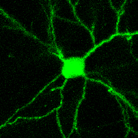

Position within PDF: (1705, 360)
Similarity score: 0.3038943111896515


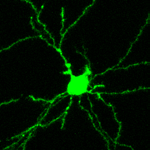

Position within PDF: (1706, 357)
Similarity score: 0.29551488161087036


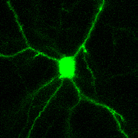

Position within PDF: (1929, 951)
Similarity score: 0.25180432200431824


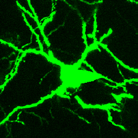

Position within PDF: (1707, 346)
Similarity score: 0.23129229247570038


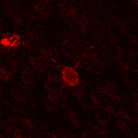

Position within PDF: (320, 904)
Similarity score: 0.22940754890441895


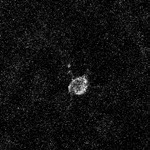

Position within PDF: (1923, 938)
Similarity score: 0.15233904123306274


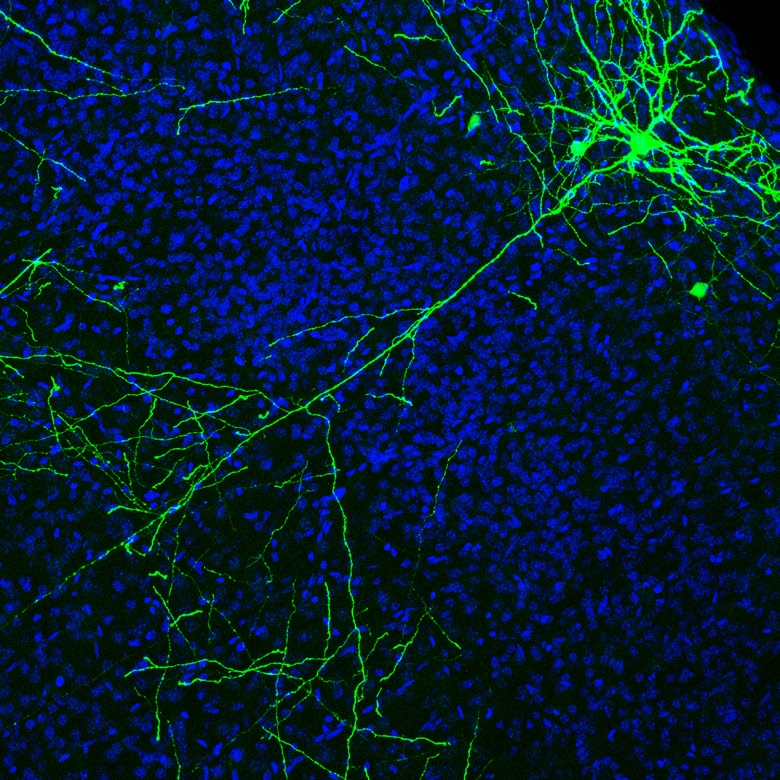

Position within PDF: (1485, 592)
Similarity score: 0.13060306012630463


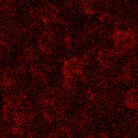

Position within PDF: (1765, 309)
Similarity score: 0.10839369893074036


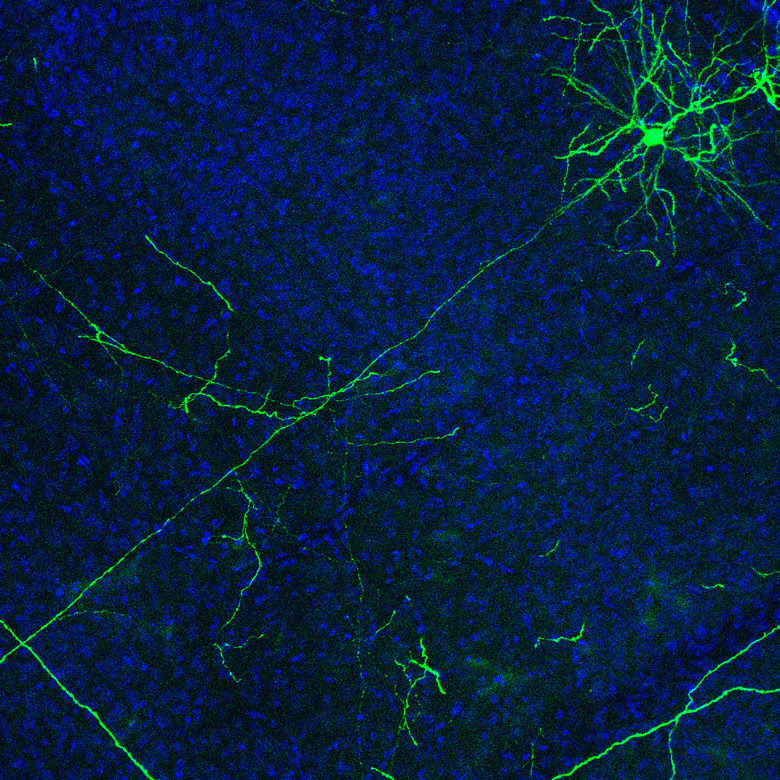

Position within PDF: (1456, 607)
Similarity score: 0.10293412208557129


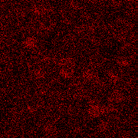

Position within PDF: (346, 1979)
Similarity score: 0.08767551928758621


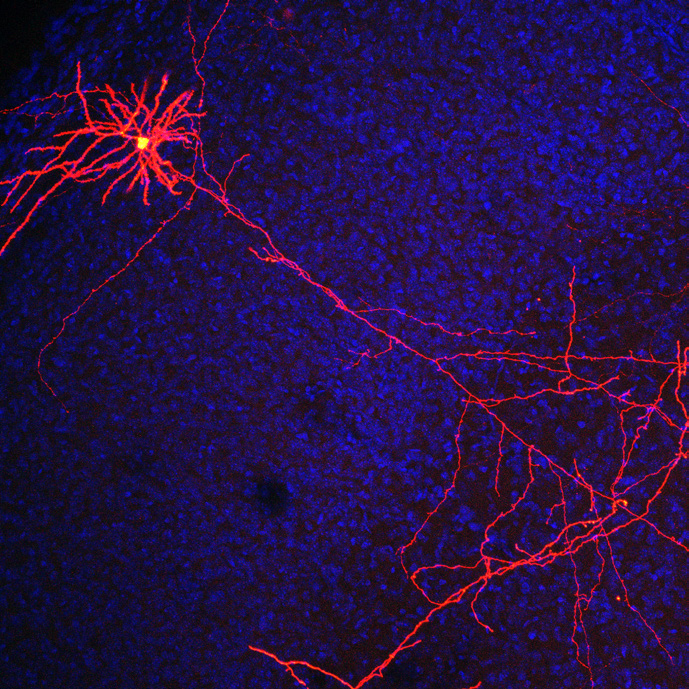

Position within PDF: (1679, 377)
Similarity score: 0.08356384932994843


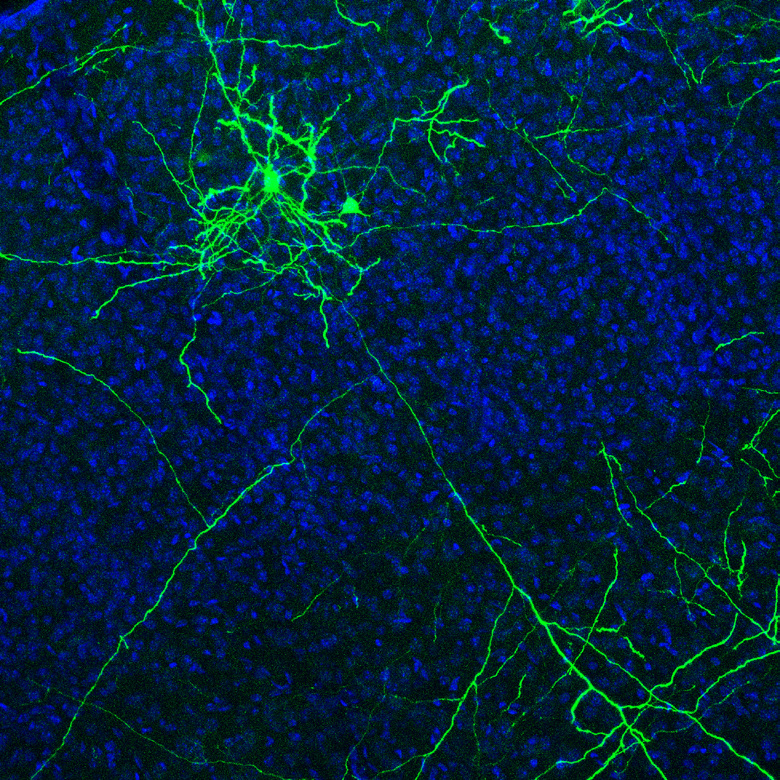

Position within PDF: (1658, 624)
Similarity score: 0.06351226568222046


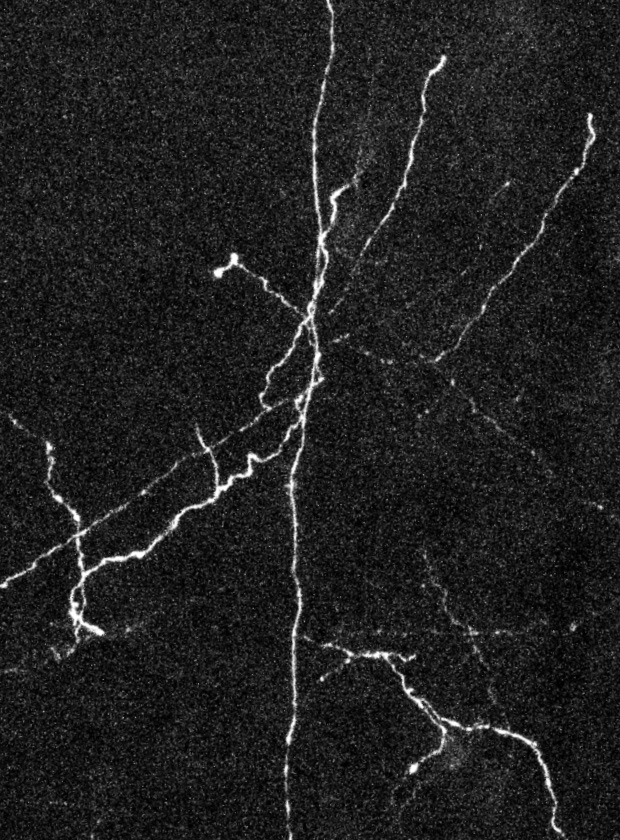

Position within PDF: (1735, 459)
Similarity score: 0.05443913862109184


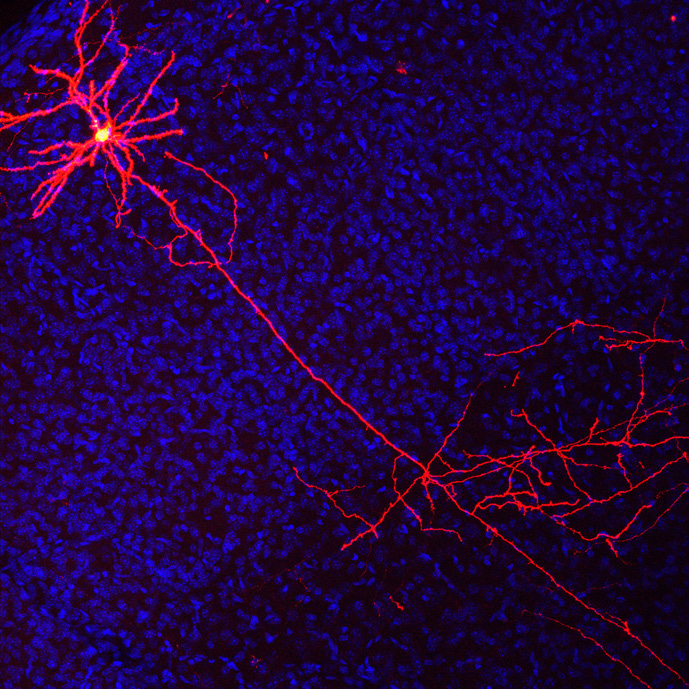

Position within PDF: (528, 1703)
Similarity score: 0.04333961755037308


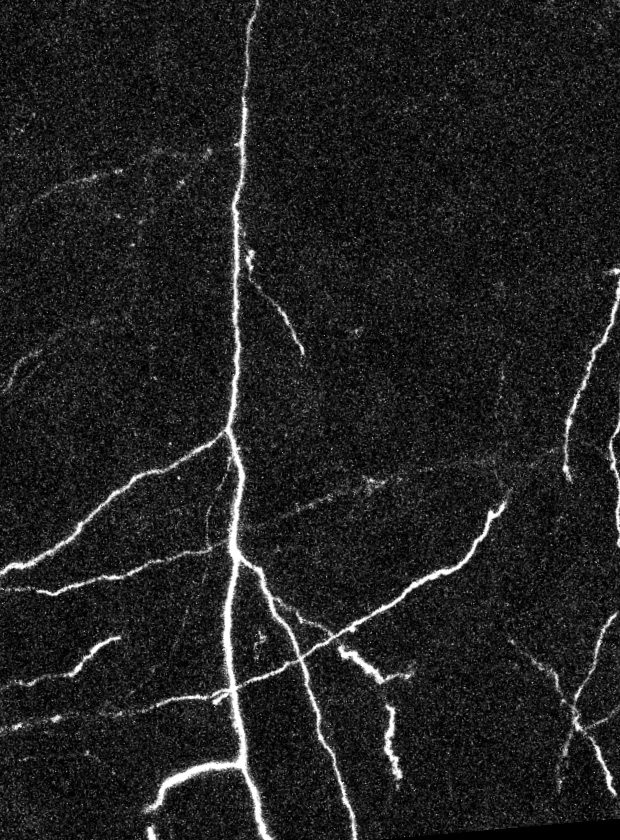

Position within PDF: (1049, 643)
Similarity score: 0.038805581629276276


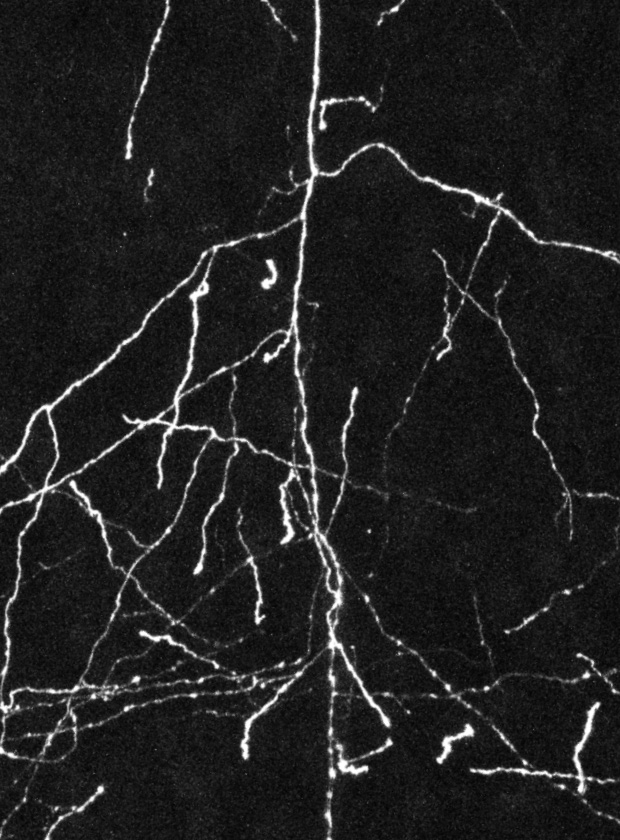

Position within PDF: (1736, 439)
Similarity score: 0.029112158343195915


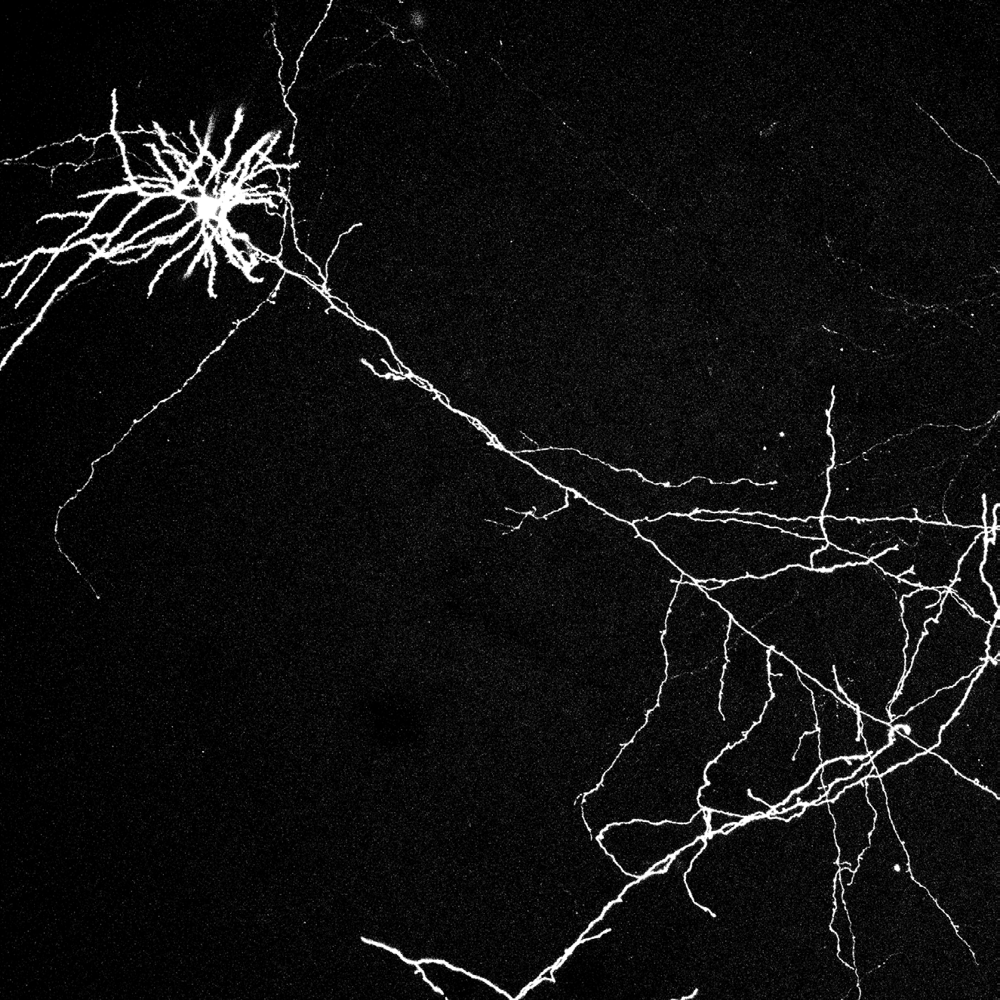

Position within PDF: (1350, 1352)
Similarity score: 0.024804558604955673


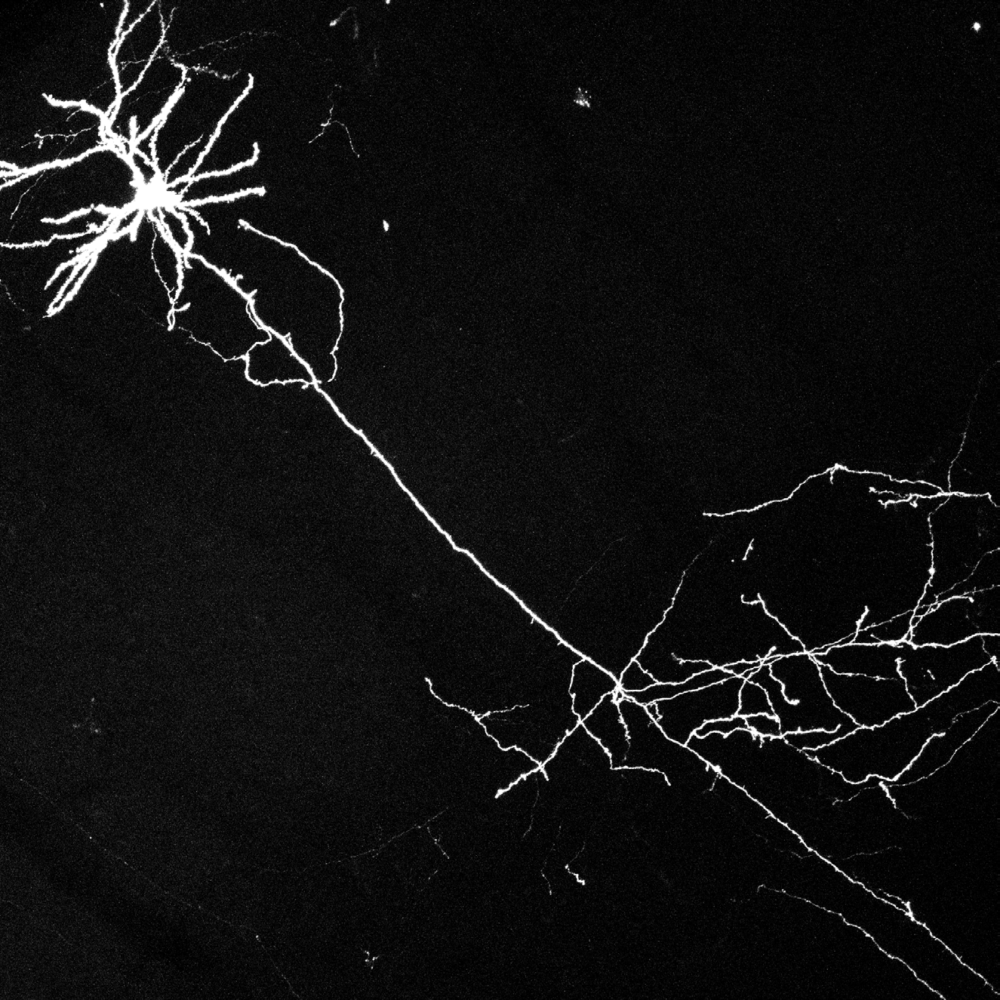

Position within PDF: (1385, 1385)


In [6]:
def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    matches = []
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        matches.append((max_val, max_loc, extracted_image))

    # Sort matches by similarity score
    matches.sort(key=lambda x: x[0], reverse=True)

    # Display top matching results
    for match in matches:
        similarity_score, max_loc, matched_image = match
        print(f"Similarity score: {similarity_score}")
        cv2_imshow(matched_image)
        
        # Calculate position within PDF
        position_within_pdf = (max_loc[0], max_loc[1])  # Top-left corner of matched region
        
        # Adjust position based on the size of the extracted image
        extracted_height, extracted_width = matched_image.shape[:2]
        position_within_pdf = (position_within_pdf[0] + extracted_width // 2, position_within_pdf[1] + extracted_height // 2)
        print(f"Position within PDF: {position_within_pdf}")

# Example usage:
pdf_path = '/home/zahra/Documents/figure3.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286_main/EMBOJ-2023-115286_main/Figure3-source files/Figure3A-MAX_MAP1B-GOF.tif'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images)


In [ ]:
output_path = "/home/zahra/Documents/highlighted_regions.pdf"


In [50]:
import fitz  # PyMuPDF

def highlight_match_in_pdf(pdf_path, position_within_pdf, extracted_image):
    doc = fitz.open(pdf_path)
    page = doc[0]  # Assuming we want to highlight the match on the first page
    
    # Get the width and height of the extracted image
    extracted_height, extracted_width = extracted_image.shape[:2]
    
    # Calculate the coordinates of the rectangle
    x0 = position_within_pdf[0] - extracted_width // 2
    y0 = position_within_pdf[1] - extracted_height // 2  # Adjusted position
    x1 = x0 + extracted_width
    y1 = y0 + extracted_height
    
    # Draw the rectangle on the page
    highlight_color = (0, 1, 0)  # Green color in the range 0 to 1
    page.draw_rect(fitz.Rect(x0, y0, x1, y1), color=highlight_color, width=2)
    
    # Save the modified PDF with the highlight
    output_path = "/home/zahra/Documents/highlighted_regions.pdf"
    doc.save(output_path)
    
    # Close the PDF document
    doc.close()
    
    print(f"Highlighted PDF saved to: {output_path}")

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    best_match = None
    best_similarity_score = -1
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        _, max_val, _, max_loc = cv2.minMaxLoc(result)
        
        # Update best match if similarity score is higher
        if max_val > best_similarity_score:
            best_similarity_score = max_val
            best_match = (max_loc, extracted_image)

    # Highlight the best match within the PDF
    if best_match is not None:
        max_loc, matched_image = best_match
        print(f"Best similarity score: {best_similarity_score}")
        
        # Calculate position within PDF
        position_within_pdf = (max_loc[0], max_loc[1])  # Top-left corner of matched region
        
        # Adjust position based on the size of the extracted image
        extracted_height, extracted_width = matched_image.shape[:2]
        position_within_pdf = (position_within_pdf[0] + extracted_width // 2, position_within_pdf[1] + extracted_height // 2)
        print(f"Position within PDF: {position_within_pdf}")
        
        # Highlight the match within the PDF
        highlight_match_in_pdf(pdf_path, position_within_pdf, matched_image)


# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Documents/Figure2E-C1-MAX.tif'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images)


Best similarity score: 1.0
Position within PDF: (156, 156)
Highlighted PDF saved to: /home/zahra/Documents/highlighted_regions.pdf


In [52]:
import fitz  # PyMuPDF

def extract_images_from_pdf(pdf_path):
    extracted_regions = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            bbox = fitz.Rect(img_info["rect"]).rect
            extracted_regions.append((image_bytes, bbox))
    return extracted_regions

def highlight_extracted_regions_in_pdf(pdf_path, extracted_regions):
    doc = fitz.open(pdf_path)
    for image_bytes, bbox in extracted_regions:
        page = doc[0]  # Assuming we want to highlight on the first page
        highlight_color = (0, 1, 0)  # Green color in the range 0 to 1
        page.draw_rect(bbox, color=highlight_color, width=2)

    # Save the modified PDF with the highlights
    output_path = "/home/zahra/Documents/highlighted_regions.pdf"
    doc.save(output_path)
    
    # Close the PDF document
    doc.close()
    
    print(f"Highlighted PDF saved to: {output_path}")

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
extracted_regions = extract_images_from_pdf(pdf_path)
highlight_extracted_regions_in_pdf(pdf_path, extracted_regions)


TypeError: tuple indices must be integers or slices, not str

In [76]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import io
from IPython.display import display
from PIL import Image as PILImage  # Alias PIL Image to avoid naming conflict

def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append((page_num, image_bytes))
    return images

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    matches = []
    for page_num, extracted_image_bytes in extracted_images:
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        matches.append((max_val, max_loc, extracted_image, page_num))

    # Sort matches by similarity score
    matches.sort(key=lambda x: x[0], reverse=True)

    return matches

def highlight_regions_in_pdf(pdf_path, matches):
    doc = fitz.open(pdf_path)
    page = doc[0]  # Get the first (and only) page
    for match in matches:
        _, max_loc, extracted_image, _ = match  # Unpack the match tuple
        x1, y1 = max_loc  # Top-left coordinates of extracted image
        x2, y2 = x1 + extracted_image.shape[1], y1 + extracted_image.shape[0]  # Bottom-right coordinates of extracted image
        page.draw_rect(fitz.Rect(x1, y1, x2, y2), color=(1, 0, 0), width=2)  # Draw a red rectangle around the extracted region
    doc.save("/home/zahra/Documents/highlighted_regions.pdf", garbage=4, deflate=True, clean=True)
    doc.close()


# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286 main figure source files/EMBOJ-2023-115286 main figure source files/Figure2E-MAP1B-Flag.tif'
extracted_images = extract_images_from_pdf(pdf_path)
matches = match_template_with_extracted_images(input_image_path, extracted_images)
highlight_regions_in_pdf(pdf_path, [matches[0]])  # Highlight only the best match


In [47]:
import fitz

def inspect_img_info(pdf_path):
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            print(f"Page: {page_num + 1}, Image index: {img_index + 1}")
            print("Image info:", img_info)

# Replace 'pdf_path' with the path to your PDF file
pdf_path = '/home/zahra/Documents/figure2.pdf'
inspect_img_info(pdf_path)


Page: 1, Image index: 1
Image info: (6, 0, 824, 824, 8, 'DeviceRGB', '', 'x6', 'DCTDecode', 0)
Page: 1, Image index: 2
Image info: (7, 0, 824, 824, 8, 'DeviceRGB', '', 'x7', 'DCTDecode', 0)
Page: 1, Image index: 3
Image info: (11, 0, 886, 886, 8, 'DeviceRGB', '', 'x11', 'DCTDecode', 0)
Page: 1, Image index: 4
Image info: (12, 0, 886, 886, 8, 'DeviceRGB', '', 'x12', 'DCTDecode', 0)
Page: 1, Image index: 5
Image info: (13, 0, 2048, 2048, 8, 'DeviceGray', '', 'x13', 'DCTDecode', 0)
Page: 1, Image index: 6
Image info: (14, 0, 2048, 2048, 8, 'DeviceGray', '', 'x14', 'DCTDecode', 0)
Page: 1, Image index: 7
Image info: (15, 0, 2048, 2048, 8, 'DeviceGray', '', 'x15', 'DCTDecode', 0)
Page: 1, Image index: 8
Image info: (16, 0, 2048, 2048, 8, 'DeviceGray', '', 'x16', 'DCTDecode', 0)
Page: 1, Image index: 9
Image info: (17, 0, 2048, 2048, 8, 'DeviceRGB', '', 'x17', 'DCTDecode', 0)
Page: 1, Image index: 10
Image info: (18, 0, 2048, 2048, 8, 'DeviceRGB', '', 'x18', 'DCTDecode', 0)
Page: 1, Image in

In [39]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import io
from IPython.display import display
from PIL import Image as PILImage  # Alias PIL Image to avoid naming conflict

def cv2_imshow(a, format='png', **kwargs):
    """A replacement for cv2.imshow() for use in Jupyter notebooks intended to mimic the behavior of cv2.imshow()."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))  # Open image for display

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            images.append((base_image["image"], img_info["rect"]))
    return images

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    matches = []
    for index, (extracted_image_bytes, rect) in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        matches.append((max_val, max_loc, extracted_image, rect))

    # Sort matches by similarity score
    matches.sort(key=lambda x: x[0], reverse=True)

    # Highlight the region of the best match in the PDF
    best_match = matches[0]
    _, _, _, best_rect = best_match
    highlight_region(pdf_path, best_rect)

    # Display top matching results
    for match in matches:
        similarity_score, _, matched_image, _ = match
        print(f"Similarity score: {similarity_score}")
        cv2_imshow(matched_image)

def highlight_region(pdf_path, rect):
    doc = fitz.open(pdf_path)
    page = doc[rect[3]]  # Page number is 0-based
    highlight = page.add_rect_annot(rect)
    highlight.set_border(fitz.utils.getColor('red'))
    doc.save("/home/zahra/Image_checker/highlighted_pdf.pdf", incremental=True)
    doc.close()


# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286 main figure source files/EMBOJ-2023-115286 main figure source files/Figure2E-MAP1B-Flag.tif'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images)


TypeError: tuple indices must be integers or slices, not str

In [40]:
def mark_best_match_in_pdf(pdf_path, page_num, match_loc, match_size, output_pdf_path):
    doc = fitz.open(pdf_path)
    if page_num < 0 or page_num >= len(doc):
        raise ValueError("Page number is out of range.")
    page = doc.load_page(page_num)
    # Get the width and height of the page
    page_width = page.rect.width
    page_height = page.rect.height
    # Calculate coordinates for the bounding box
    top_left = (match_loc[0], page_height - match_loc[1] - match_size[1])
    bottom_right = (match_loc[0] + match_size[0], page_height - match_loc[1])
    # Draw a red rectangle around the matched region
    page.draw_rect(fitz.Rect(top_left[0], top_left[1], bottom_right[0], bottom_right[1]), color=(1, 0, 0), width=2)
    doc.save(output_pdf_path)
    doc.close()

def match_template_with_extracted_images(input_image_path, extracted_images, pdf_path, output_pdf_path):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")

    # Convert input image to grayscale
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

    # Apply template matching to each extracted image
    best_match = None
    best_score = -1
    for index, extracted_image_bytes in enumerate(extracted_images):
        extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        _, max_val, _, max_loc = cv2.minMaxLoc(result)
        if max_val > best_score:
            best_score = max_val
            best_match = (index, max_loc, extracted_image.shape[::-1])  # (index, location, size)

    # Display the best matching result
    if best_match:
        index, match_loc, match_size = best_match
        similarity_score = best_score
        matched_image = cv2.imdecode(np.frombuffer(extracted_images[index], dtype=np.uint8), cv2.IMREAD_COLOR)
        print(f"Best similarity score: {similarity_score}")
        cv2_imshow(matched_image)

        # Mark the best match in the PDF
        mark_best_match_in_pdf(pdf_path, page_num=index, match_loc=match_loc, match_size=match_size, output_pdf_path=output_pdf_path)


# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286 main figure source files/EMBOJ-2023-115286 main figure source files/Figure2E-MAP1B-Flag.tif'
output_pdf_path = '/home/zahra/Image_checker/highlighted_pdf.pdf'
extracted_images = extract_images_from_pdf(pdf_path)
match_template_with_extracted_images(input_image_path, extracted_images, pdf_path, output_pdf_path)


TypeError: tuple indices must be integers or slices, not str

In [31]:
import cv2
import numpy as np
import fitz  # PyMuPDF

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            base_image = doc.extract_image(img_info[0])
            image_bytes = base_image["image"]
            images.append((image_bytes, img_info))
    doc.close()
    return images

def highlight_matching_areas_in_pdf(pdf_path, input_image_path, extracted_images, threshold=0.8):
    doc = fitz.open(pdf_path)
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")
    
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
    
    try:
        for extracted_image_bytes, img_info in extracted_images:
            extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
            extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
            
            result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
            _, max_val, _, max_loc = cv2.minMaxLoc(result)

            if max_val >= threshold:
                page_num = img_info[1]  # Page number of the extracted image
                page = doc.load_page(page_num)
                page_height = page.rect.height
                
                x1, y1 = max_loc
                x2, y2 = x1 + extracted_gray.shape[1], y1 + extracted_gray.shape[0]
                
                # Convert coordinates from image to PDF page coordinates
                x1_page, y1_page = img_info[2][:2]  # Left-top corner coordinates of the extracted image
                x2_page = x1_page + img_info[2][2]   # Right-bottom corner x-coordinate of the extracted image
                y2_page = y1_page + img_info[2][3]   # Right-bottom corner y-coordinate of the extracted image
                
                # Adjust coordinates for PDF page
                x1, y1 = x1 + x1_page, y1 + y1_page
                x2, y2 = x2 + x1_page, y2 + y1_page
                
                # Draw rectangle on the PDF page
                rect = fitz.Rect(x1, page_height - y2, x2, page_height - y1)
                page.draw_rect(rect, color=(1, 0, 0), overlay=True, width=2)

        doc.save('/home/zahra/Image_checker/highlighted_pdf.pdf')
    finally:
        doc.close()

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286 main figure source files/EMBOJ-2023-115286 main figure source files/Figure2-source files/Figure2E-C1-MAX.tif'
extracted_images = extract_images_from_pdf(pdf_path)
highlight_matching_areas_in_pdf(pdf_path, input_image_path, extracted_images)


TypeError: 'int' object is not subscriptable

In [27]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import io
from PIL import Image as PILImage  # Alias PIL Image to avoid naming conflict

def cv2_imshow(a, format='png', **kwargs):
    """Displays an image in a Jupyter notebook."""
    a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    f = io.BytesIO()
    PILImage.fromarray(a).save(f, format)
    display(PILImage.open(f))

def extract_images_from_pdf(pdf_path):
    doc = fitz.open(pdf_path)
    images = []
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            # Convert width and height to integers
            width = int(base_image["width"])
            height = int(base_image["height"])
            images.append((page_num, image_bytes, width, height))  # Include page number and dimensions as integers
    return images, doc

def match_template_with_extracted_images(input_image_path, extracted_images):
    input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
    if input_image is None:
        raise ValueError("Input image couldn't be loaded.")
    input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)
    input_size = input_image.shape[1], input_image.shape[0]  # width, height
    best_match = None
    best_score = -1

    for page_num, image_bytes, width, height in extracted_images:
        extracted_image = cv2.imdecode(np.frombuffer(image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
        extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
        result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
        if max_val > best_score:
            best_score = max_val
            best_match = (page_num, max_loc, input_size)

    return best_match, best_score

def highlight_match_in_pdf(doc, match_details):
    page_num, (x, y), (template_width, template_height) = match_details
    page = doc[page_num]
    rect = fitz.Rect(x, y, x + template_width, y + template_height)
    page.draw_rect(rect, color=(1, 0, 0), width=1.5)  # Draw red rectangle
    doc.save("highlighted_output.pdf", garbage=4, deflate=True, clean=True)
    print("Output PDF saved with highlighted match.")

# Example usage
pdf_path = '/home/zahra/Documents/figure2.pdf'
input_image_path = '/home/zahra/Downloads/EMBOJ-2023-115286 main figure source files/EMBOJ-2023-115286 main figure source files/Figure2-source files/Figure2E-MAP1B-Flag.tif'
extracted_images, doc = extract_images_from_pdf(pdf_path)
match_details, score = match_template_with_extracted_images(input_image_path, extracted_images)
print(f"Best match found with score: {score}")
highlight_match_in_pdf(doc, match_details)


Best match found with score: 0.9980993270874023
Output PDF saved with highlighted match.


In [7]:
import cv2
import numpy as np
import fitz  # PyMuPDF
import os
import glob

def extract_images_from_pdf(pdf_path):
    images = []
    doc = fitz.open(pdf_path)
    for page_num in range(len(doc)):
        image_list = doc[page_num].get_images(full=True)
        for img_index, img_info in enumerate(image_list):
            xref = img_info[0]
            base_image = doc.extract_image(xref)
            image_bytes = base_image["image"]
            images.append(image_bytes)
    return images

def highlight_matching_areas_in_pdf(pdf_path, folder_path, extracted_images):
    doc = fitz.open(pdf_path)
    image_files = glob.glob(os.path.join(folder_path, '*.tif')) + glob.glob(os.path.join(folder_path, '*.jpg'))  # Add more formats if needed

    for input_image_path in image_files:
        input_image = cv2.imread(input_image_path, cv2.IMREAD_COLOR)
        if input_image is None:
            continue
        
        input_gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

        for page_num in range(len(doc)):
            page = doc.load_page(page_num)
            page_image = page.get_pixmap()
            page_height = page.rect.height

            for extracted_image_bytes in extracted_images:
                extracted_image = cv2.imdecode(np.frombuffer(extracted_image_bytes, dtype=np.uint8), cv2.IMREAD_COLOR)
                extracted_gray = cv2.cvtColor(extracted_image, cv2.COLOR_BGR2GRAY)
                result = cv2.matchTemplate(input_gray, extracted_gray, cv2.TM_CCOEFF_NORMED)
                min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
                
                if max_val > 0.8:  # Adjust threshold as needed
                    x1, y1 = max_loc
                    x2, y2 = x1 + extracted_gray.shape[1], y1 + extracted_gray.shape[0]
                    x1, y1, x2, y2 = x1, page_height - y2, x2, page_height - y1
                    rect = fitz.Rect(x1, y1, x2, y2)
                    outline_color = (1, 0, 0)  # Red outline color
                    page.draw_rect(rect, color=outline_color, overlay=True, width=2)

    # Save the modified PDF after all images have been processed
    save_path = os.path.join(os.path.dirname(pdf_path), 'highlighted_pdf.pdf')
    doc.save(save_path)
    doc.close()

    return save_path

# Example usage:
pdf_path = '/home/zahra/Documents/figure2.pdf'
folder_path = '/home/zahra/Downloads/EMBOJ-2023-115286 main figure source files/EMBOJ-2023-115286 main figure source files/Figure2-source files'
extracted_images = extract_images_from_pdf(pdf_path)
output_pdf_path = highlight_matching_areas_in_pdf(pdf_path, folder_path, extracted_images)
print(f"Modified PDF saved at: {output_pdf_path}")


Modified PDF saved at: /home/zahra/Documents/highlighted_pdf.pdf


In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

def find_template_with_scaling_and_rotation(large_image_path, small_image_path):
    img = cv2.imread(large_image_path, cv2.IMREAD_COLOR)
    template_orig = cv2.imread(small_image_path, cv2.IMREAD_COLOR)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    large_image_size_mm=1
    small_image_size_um=100

    # Calculate scaling factor (from um to mm and considering image dimensions)
    scale_factor = (small_image_size_um / 1000) / large_image_size_mm
    new_template_width = int(template_orig.shape[1] * scale_factor)
    new_template_height = int(template_orig.shape[0] * scale_factor)
    resized_template = cv2.resize(template_orig, (new_template_width, new_template_height), interpolation=cv2.INTER_AREA)

    # Try different angles
    best_score = -1
    best_angle = 0
    best_loc = None
    best_match = None
    for angle in range(0, 360, 1):
        template = rotate_image(resized_template, angle)
        template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
        res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        if max_val > best_score:
            best_score = max_val
            best_angle = angle
            best_loc = max_loc
            best_match = template.copy()

    # Extract best matching region
    top_left = best_loc
    h, w = best_match.shape[:2]
    bottom_right = (top_left[0] + w, top_left[1] + h)
    matched_region = img[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w]

    # Calculate differences and create mask
    diff = cv2.absdiff(matched_region, best_match)
    _, mask = cv2.threshold(cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY), 50, 255, cv2.THRESH_BINARY)

    # Apply mask to highlight differences in red on the original image
    img_highlighted = img.copy()
    img_highlighted[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w][mask > 0] = [0, 0, 255]

    # Display the image
    plt.figure(figsize=(15, 10))
    plt.subplot(121), plt.imshow(cv2.cvtColor(best_match, cv2.COLOR_BGR2RGB))
    plt.title('Best Matched Template at ' + str(best_angle) + ' Degrees')
    plt.subplot(122), plt.imshow(cv2.cvtColor(img_highlighted, cv2.COLOR_BGR2RGB))
    plt.title('Detected Area with Highlighted Differences')
    plt.show()

# Example usage:
find_template_with_scaling_and_rotation(
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif',
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif'

)

[ WARN:0@0.723] global loadsave.cpp:248 findDecoder imread_('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif'): can't open/read file: check file path/integrity


error: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


Zoomed-in image saved successfully.


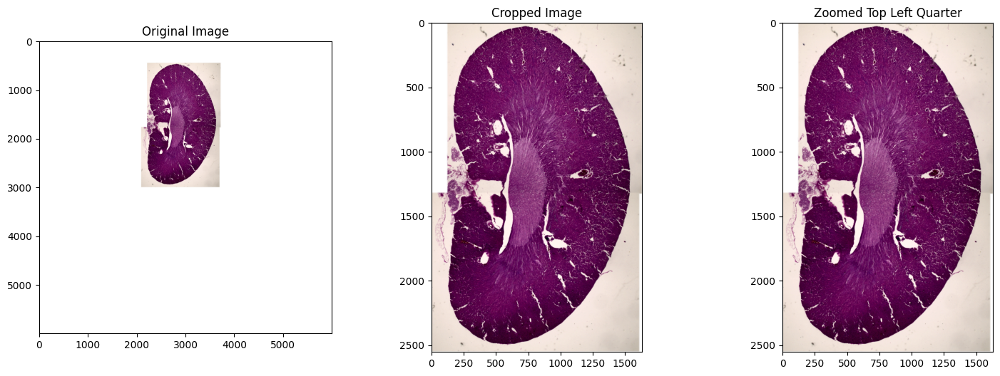

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def auto_crop_and_zoom_save_image(image_path, output_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Image not loaded, check the path.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply threshold to get binary image and invert it
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY_INV)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        # Assume the largest external contour in image is the main object
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # Crop the image using the dimensions of the bounding rectangle
        cropped_img = img[y:y + h, x:x + w]

        # Calculate dimensions for the top left quarter
        quarter_height, quarter_width = cropped_img.shape[0] // 1, cropped_img.shape[1] //1
        top_left_quarter = cropped_img[0:quarter_height, 0:quarter_width]

        # Save the zoomed-in top left quarter
        cv2.imwrite(output_path, top_left_quarter)
        print("Zoomed-in image saved successfully.")

        # Show the original, cropped, and zoomed images
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')

        plt.subplot(1, 3, 2)
        plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
        plt.title('Cropped Image')

        plt.subplot(1, 3, 3)
        plt.imshow(cv2.cvtColor(top_left_quarter, cv2.COLOR_BGR2RGB))
        plt.title('Zoomed Top Left Quarter')
        plt.show()
    else:
        print("No significant contours detected.")

# Example usage
auto_crop_and_zoom_save_image('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-2x.tif', '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif')

In [36]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

def find_template_with_rotation_and_color_highlight(large_image_path, small_image_path):
    img = cv2.imread(large_image_path, cv2.IMREAD_COLOR)
    template_orig = cv2.imread(small_image_path, cv2.IMREAD_COLOR)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Try different angles
    best_score = -1
    best_angle = 0
    best_loc = None
    best_match = None
    for angle in range(0, 360, 1):  # Adjust step for finer/coarser search
        template = rotate_image(template_orig, angle)
        template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
        res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        if max_val > best_score:
            best_score = max_val
            best_angle = angle
            best_loc = max_loc
            best_match = template.copy()

    # Extract best matching region
    top_left = best_loc
    h, w = best_match.shape[:2]
    bottom_right = (top_left[0] + w, top_left[1] + h)
    matched_region = img[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w]

    # Calculate differences and create mask
    diff = cv2.absdiff(matched_region, best_match)
    _, mask = cv2.threshold(cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY), 50, 255, cv2.THRESH_BINARY)  # Sensitivity adjustment needed

    # Apply mask to highlight differences in red on the original image
    img_highlighted = img.copy()
    img_highlighted[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w][mask > 0] = [0, 0, 255]

    # Display the image
    plt.figure(figsize=(15, 10))
    plt.subplot(121), plt.imshow(cv2.cvtColor(best_match, cv2.COLOR_BGR2RGB))
    plt.title('Best Matched Template at ' + str(best_angle) + ' Degrees')
    plt.subplot(122), plt.imshow(cv2.cvtColor(img_highlighted, cv2.COLOR_BGR2RGB))
    plt.title('Detected Area with Highlighted Differences')
    plt.show()
    
find_template_with_rotation_and_color_highlight('home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif', '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')

[ WARN:0@8774.130] global loadsave.cpp:248 findDecoder imread_('home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif'): can't open/read file: check file path/integrity


error: OpenCV(4.9.0) /io/opencv/modules/imgproc/src/color.cpp:196: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Initialize global variables
ref_point = []  # To store rectangle coordinates
cropping = False  # State to indicate cropping

def click_and_crop(event, x, y, flags, param):
    # Refer to global variables
    global ref_point, cropping, image

    # Record starting point on mouse down
    if event == cv2.EVENT_LBUTTONDOWN:
        ref_point = [(x, y)]
        cropping = True

    # Record end point on mouse up and crop
    elif event == cv2.EVENT_LBUTTONUP:
        ref_point.append((x, y))
        cropping = False

        # Draw a rectangle around the selected region
        cv2.rectangle(image, ref_point[0], ref_point[1], (0, 255, 0), 2)
        cv2.imshow("image", image)

def zoom_into_image(image_path, output_path, zoom_factor=20):
    global image
    # Load the image and clone it for resetting
    image = cv2.imread(image_path)
    if image is None:
        print("Error: Image not loaded, check the path.")
        return

    clone = image.copy()
    cv2.namedWindow("image")
    cv2.setMouseCallback("image", click_and_crop)

    # Keep the window open until 'c' is pressed
    while True:
        cv2.imshow("image", image)
        key = cv2.waitKey(1) & 0xFF

        # Press 'r' to reset the cropping region
        if key == ord('r'):
            image = clone.copy()

        # Press 'c' to confirm the crop and close the window
        elif key == ord('c'):
            break

    if len(ref_point) == 2:
        # Retrieve the rectangle dimensions
        x_start, y_start = ref_point[0]
        x_end, y_end = ref_point[1]
        # Crop and zoom the selected area
        cropped_img = clone[y_start:y_end, x_start:x_end]
        width = x_end - x_start
        height = y_end - y_start
        # Resize cropped area
        zoomed_img = cv2.resize(cropped_img, (width * zoom_factor, height * zoom_factor), interpolation=cv2.INTER_LINEAR)

        # Save the zoomed image
        cv2.imwrite(output_path, zoomed_img)
        print("Zoomed image saved successfully.")

        # Show the zoomed image
        plt.figure("Zoomed")
        plt.imshow(cv2.cvtColor(zoomed_img, cv2.COLOR_BGR2RGB))
        plt.title('Zoomed Image')
        plt.show()

    # Close all open windows
    cv2.destroyAllWindows()
zoom_into_image('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-2x.tif', '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif', zoom_factor=20)


error: OpenCV(4.9.0) /io/opencv/modules/highgui/src/window.cpp:1255: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvNamedWindow'


In [30]:
import cv2
import numpy as np
from sklearn.cluster import DBSCAN

# Load images
large_image = cv2.imread('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')
small_image = cv2.imread('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-2x.tif')

# Proceed with feature matching using ORB detector
orb = cv2.ORB_create()

# Detect keypoints and descriptors
kp1, des1 = orb.detectAndCompute(large_image, None)
kp2, des2 = orb.detectAndCompute(small_image, None)

# Create BFMatcher object
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)

# Match descriptors
matches = bf.match(des1, des2)

# Sort matches in the order of their distance (best matches first)
matches = sorted(matches, key=lambda x: x.distance)

# Draw first 10 matches
matched_image = cv2.drawMatches(large_image, kp1, small_image, kp2, matches[:10], None, flags=2)

# Save the image with matches
matched_image_path = '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/matched_image.png'
cv2.imwrite(matched_image_path, matched_image)

matched_image_path


'/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/matched_image.png'

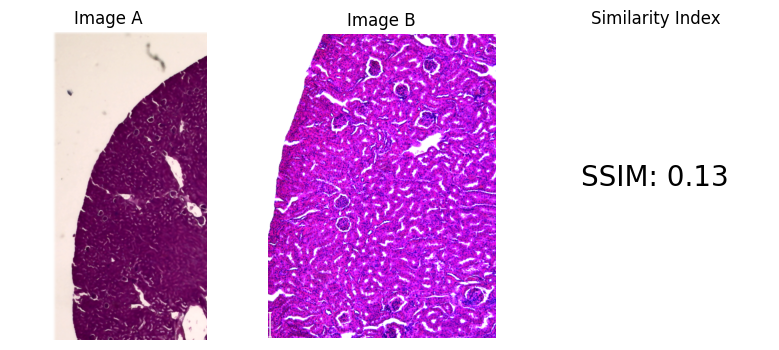

SSIM: 0.1250029194447787


In [27]:
import cv2
from skimage.metrics import structural_similarity as ssim
import matplotlib.pyplot as plt

def compare_images(imageA_path, imageB_path):
    # Load the two images
    imageA = cv2.imread(imageA_path, cv2.IMREAD_GRAYSCALE)
    imageB = cv2.imread(imageB_path, cv2.IMREAD_GRAYSCALE)

    if imageA is None or imageB is None:
        print("Error loading one of the images.")
        return

    # Ensure both images are the same size
    hA, wA = imageA.shape[:2]
    hB, wB = imageB.shape[:2]
    min_height, min_width = min(hA, hB), min(wA, wB)

    # Resize images to the smallest of each dimension
    imageA_resized = cv2.resize(imageA, (min_width, min_height))
    imageB_resized = cv2.resize(imageB, (min_width, min_height))

    # Compute the SSIM between the two images
    similarity_index = ssim(imageA_resized, imageB_resized)

    # Display the images and SSIM
    fig, axs = plt.subplots(1, 3, figsize=(10, 4))
    axs[0].imshow(cv2.cvtColor(cv2.imread(imageA_path), cv2.COLOR_BGR2RGB))
    axs[0].set_title('Image A')
    axs[0].axis('off')

    axs[1].imshow(cv2.cvtColor(cv2.imread(imageB_path), cv2.COLOR_BGR2RGB))
    axs[1].set_title('Image B')
    axs[1].axis('off')

    axs[2].text(0.5, 0.5, f'SSIM: {similarity_index:.2f}', fontsize=20, ha='center')
    axs[2].set_title('Similarity Index')
    axs[2].axis('off')

    plt.show()

    return similarity_index

# Example usage
sim_index = compare_images('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif', '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')
print("SSIM:", sim_index)


In [28]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

def find_template_with_rotation_and_highlight(large_image_path, small_image_path):
    img = cv2.imread(large_image_path, cv2.IMREAD_COLOR)
    template_orig = cv2.imread(small_image_path, cv2.IMREAD_COLOR)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Try different angles
    best_score = -1
    best_angle = 0
    best_loc = None
    best_match = None
    for angle in range(0, 360, 1):  # Adjust step for finer/coarser search
        template = rotate_image(template_orig, angle)
        template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
        res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        if max_val > best_score:
            best_score = max_val
            best_angle = angle
            best_loc = max_loc
            best_match = template.copy()

    # Extract best matching region
    top_left = best_loc
    h, w = best_match.shape[:2]
    bottom_right = (top_left[0] + w, top_left[1] + h)
    matched_region = img[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w]

    # Calculate differences and create mask
    diff = cv2.absdiff(matched_region, best_match)
    mask = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(mask, 50, 255, cv2.THRESH_BINARY_INV)  # Sensitivity adjustment needed

    # Highlight differences in red
    img_highlighted = img.copy()
    img_highlighted[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w][mask > 0] = [0, 0, 255]

    # Display the image
    plt.figure(figsize=(15, 10))
    plt.subplot(121), plt.imshow(cv2.cvtColor(best_match, cv2.COLOR_BGR2RGB))
    plt.title('Best Matched Template at ' + str(best_angle) + ' Degrees')
    plt.subplot(122), plt.imshow(cv2.cvtColor(img_highlighted, cv2.COLOR_BGR2RGB))
    plt.title('Detected Area with Highlighted Differences')
    plt.show()

# Example usage
find_template_with_rotation_and_highlight('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif', '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')

error: OpenCV(4.9.0) /io/opencv/modules/core/src/arithm.cpp:647: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'


In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def rotate_image(image, angle):
    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return rotated

def find_template_with_rotation_and_highlight(large_image_path, small_image_path):
    img = cv2.imread(large_image_path, cv2.IMREAD_COLOR)
    template_orig = cv2.imread(small_image_path, cv2.IMREAD_COLOR)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Try different angles
    best_score = -1
    best_angle = 0
    best_loc = None
    best_match = None
    for angle in range(0, 360, 1):  # Adjust step for finer/coarser search
        template = rotate_image(template_orig, angle)
        template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
        res = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        if max_val > best_score:
            best_score = max_val
            best_angle = angle
            best_loc = max_loc
            best_match = template.copy()

    # Extract best matching region
    top_left = best_loc
    h, w = best_match.shape[:2]
    bottom_right = (top_left[0] + w, top_left[1] + h)
    matched_region = img[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w]

    # Calculate differences and create mask
    diff = cv2.absdiff(matched_region, best_match)
    mask = cv2.cvtColor(diff, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(mask, 50, 255, cv2.THRESH_BINARY_INV)  # Sensitivity adjustment needed

    # Highlight differences in red
    img_highlighted = img.copy()
    img_highlighted[top_left[1]:top_left[1]+h, top_left[0]:top_left[0]+w][mask > 0] = [0, 0, 255]

    # Display the image
    plt.figure(figsize=(15, 10))
    plt.subplot(121), plt.imshow(cv2.cvtColor(best_match, cv2.COLOR_BGR2RGB))
    plt.title('Best Matched Template at ' + str(best_angle) + ' Degrees')
    plt.subplot(122), plt.imshow(cv2.cvtColor(img_highlighted, cv2.COLOR_BGR2RGB))
    plt.title('Detected Area with Highlighted Differences')
    plt.show()

# Example usage
find_template_with_rotation_and_highlight('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif', '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')

In [32]:
import cv2
import numpy as np
from sklearn.cluster import DBSCAN

# Load images
large_image = cv2.imread('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-2x.tif')
small_image = cv2.imread('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')

# Convert images to grayscale for template matching
large_gray = cv2.cvtColor(large_image, cv2.COLOR_BGR2GRAY)
small_gray = cv2.cvtColor(small_image, cv2.COLOR_BGR2GRAY)

# Assuming that the scale factor between the images is known
scale_factor = 10  # example scale factor, needs to be adjusted to your specific case

# Resize the small image according to the scale factor
small_gray_resized = cv2.resize(small_gray, (int(small_gray.shape[1] / scale_factor), int(small_gray.shape[0] / scale_factor)))

# Template matching
result = cv2.matchTemplate(large_gray, small_gray_resized, cv2.TM_CCOEFF_NORMED)

# Find the best match location
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
top_left = max_loc
bottom_right = (top_left[0] + small_gray_resized.shape[1], top_left[1] + small_gray_resized.shape[0])

# Draw a rectangle on the large image
cv2.rectangle(large_image, top_left, bottom_right, (0, 255, 0), 2)

# Display the result
cv2.imshow('Matched Image', large_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Optionally, save the result to a file
output_path = '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/matched_image.png'
cv2.imwrite(output_path, large_image)

error: OpenCV(4.9.0) /io/opencv/modules/highgui/src/window.cpp:1272: error: (-2:Unspecified error) The function is not implemented. Rebuild the library with Windows, GTK+ 2.x or Cocoa support. If you are on Ubuntu or Debian, install libgtk2.0-dev and pkg-config, then re-run cmake or configure script in function 'cvShowImage'


In [ ]:
import cv2
import numpy as np
import cv2

def display_image_with_timeout(image, timeout=5000):
    cv2.imshow("Image", image)
    cv2.waitKey(timeout)  # Wait for 'timeout' milliseconds
    cv2.destroyAllWindows()

def adjust_orientation_by_contour(image):
    # Ensure the image is in grayscale
    if len(image.shape) > 2:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Threshold to create a binary image
    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    rect = cv2.minAreaRect(largest_contour)
    angle = rect[2]
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    
    # Calculate the rotation matrix and rotate the image
    (h, w) = gray.shape
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    adjusted_image = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return adjusted_image

def extract_and_align_by_contour(zoomed_image, large_image):
    adjusted_zoomed_image = adjust_orientation_by_contour(zoomed_image)
    
    # Ensure images are in grayscale for contour analysis
    gray1 = cv2.cvtColor(adjusted_zoomed_image, cv2.COLOR_BGR2GRAY) if len(adjusted_zoomed_image.shape) > 2 else adjusted_zoomed_image
    gray2 = cv2.cvtColor(large_image, cv2.COLOR_BGR2GRAY) if len(large_image.shape) > 2 else large_image

    _, thresh1 = cv2.threshold(gray1, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    _, thresh2 = cv2.threshold(gray2, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    contours1, _ = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours2, _ = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    largest_contour1 = max(contours1, key=cv2.contourArea)
    best_match = None
    min_distance = float('inf')
    
    for contour in contours2:
        distance = cv2.matchShapes(largest_contour1, contour, cv2.CONTOURS_MATCH_I1, 0.0)
        if distance < min_distance:
            min_distance = distance
            best_match = contour

    if best_match is not None:
        rect = cv2.minAreaRect(best_match)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        # Additional transformation based on the best match could be applied here

    return adjusted_zoomed_image


def find_features_and_match(large_image_path, zoomed_image_path, output_image_path):
    large_image = cv2.imread(large_image_path)
    zoomed_image = cv2.imread(zoomed_image_path)
    
    adjusted_zoomed_image = extract_and_align_by_contour(zoomed_image, large_image)
    
    orb = cv2.ORB_create()
    kp1, des1 = orb.detectAndCompute(adjusted_zoomed_image, None)
    kp2, des2 = orb.detectAndCompute(large_image, None)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    img_matches = cv2.drawMatches(adjusted_zoomed_image, kp1, large_image, kp2, matches[:10], None)
    cv2.imwrite(output_image_path, img_matches)
    print("Matches image saved to", output_image_path)

# Example usage
find_features_and_match(
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif',
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif',
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/result_match_Wildtype-inset-10x.tif'
)


In [ ]:
import cv2
import numpy as np
import cv2

import cv2
import numpy as np
import cv2

def display_image_with_timeout(image, timeout=5000):
    cv2.imshow("Image", image)
    cv2.waitKey(timeout)  # Wait for 'timeout' milliseconds
    cv2.destroyAllWindows()

def adjust_orientation_by_contour(image):
    # Ensure the image is in grayscale
    if len(image.shape) > 2:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    # Threshold to create a binary image
    _, thresh = cv2.threshold(gray, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    largest_contour = max(contours, key=cv2.contourArea)
    rect = cv2.minAreaRect(largest_contour)
    angle = rect[2]
    if angle < -45:
        angle = -(90 + angle)
    else:
        angle = -angle
    
    # Calculate the rotation matrix and rotate the image
    (h, w) = gray.shape
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    adjusted_image = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return adjusted_image

def extract_and_align_by_contour(zoomed_image, large_image):
    adjusted_zoomed_image = adjust_orientation_by_contour(zoomed_image)
    
    # Ensure images are in grayscale for contour analysis
    gray1 = cv2.cvtColor(adjusted_zoomed_image, cv2.COLOR_BGR2GRAY) if len(adjusted_zoomed_image.shape) > 2 else adjusted_zoomed_image
    gray2 = cv2.cvtColor(large_image, cv2.COLOR_BGR2GRAY) if len(large_image.shape) > 2 else large_image

    _, thresh1 = cv2.threshold(gray1, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    _, thresh2 = cv2.threshold(gray2, 128, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    contours1, _ = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours2, _ = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    largest_contour1 = max(contours1, key=cv2.contourArea)
    best_match = None
    min_distance = float('inf')
    
    for contour in contours2:
        distance = cv2.matchShapes(largest_contour1, contour, cv2.CONTOURS_MATCH_I1, 0.0)
        if distance < min_distance:
            min_distance = distance
            best_match = contour

    if best_match is not None:
        rect = cv2.minAreaRect(best_match)
        box = cv2.boxPoints(rect)
        box = np.int0(box)
        # Additional transformation based on the best match could be applied here

    return adjusted_zoomed_image


def draw_rectangle_on_image(image, rectangle_coords):
    # Unpack the rectangle coordinates
    x, y, w, h = rectangle_coords
    # Draw the rectangle on the image
    cv2.rectangle(image, (x, y), (x+w, y+h), (0, 255, 0), 2)  # Green rectangle with a thickness of 2
    return image

def find_features_and_match(large_image_path, zoomed_image_path, output_image_path, rectangle_coords, display_timeout=None):
    large_image = cv2.imread(large_image_path)
    zoomed_image = cv2.imread(zoomed_image_path)
    
    # Adjust orientation of the zoomed-in image
    adjusted_zoomed_image = adjust_orientation_by_contour(zoomed_image)
    
    # Extract and align the zoomed-in area within the search area of the large image
    search_area_image = large_image[rectangle_coords[1]:rectangle_coords[1]+rectangle_coords[3],
                                    rectangle_coords[0]:rectangle_coords[0]+rectangle_coords[2]]
    aligned_zoomed_image = extract_and_align_by_contour(adjusted_zoomed_image, search_area_image)
    
    # Perform ORB feature matching between the aligned zoomed-in image and the search area of the large image
    orb = cv2.ORB_create()
    kp1, des1 = orb.detectAndCompute(aligned_zoomed_image, None)
    kp2, des2 = orb.detectAndCompute(search_area_image, None)
    
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    # Draw matches
    img_matches = cv2.drawMatches(aligned_zoomed_image, kp1, search_area_image, kp2, matches[:10], None)
    
    # Draw rectangle around the found area in the large image
    x, y, w, h = rectangle_coords
    cv2.rectangle(large_image, (x, y), (x + w, y + h), (0, 255, 0), 2)  # Green rectangle with thickness 2
    
    # Save the results image
    cv2.imwrite(output_image_path, img_matches)
    print("Matches image saved to", output_image_path)
    
    # Display the image with timeout if specified
    if display_timeout is not None:
        cv2.imshow("Zoomed Area", large_image)
        cv2.waitKey(display_timeout)
        cv2.destroyAllWindows()

        

# Example usage
find_features_and_match(
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/cropped_Wildtype-2x.tif',
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif',
    '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/result_match_Wildtype-inset-10x.tif',
    (100, 100, 300, 400),  # Example coordinates of the search area
    display_timeout=5000  # Display for 5 seconds


)


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def auto_crop_and_zoom_image(image_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Image not loaded, check the path.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply threshold to get binary image and invert it
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY_INV)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        # Assume the largest external contour in image is the main object
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # Crop the image using the dimensions of the bounding rectangle
        cropped_img = img[y:y + h, x:x + w]

        # Calculate dimensions for the top left quarter
        quarter_height, quarter_width = cropped_img.shape[0] // 2, cropped_img.shape[1] // 2
        top_left_quarter = cropped_img[0:quarter_height, 0:quarter_width]

        # Show the original, cropped, and zoomed images
        plt.figure(figsize=(18, 6))
        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image')

        plt.subplot(1, 3, 2)
        plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
        plt.title('Cropped Image')

        plt.subplot(1, 3, 3)
        plt.imshow(cv2.cvtColor(top_left_quarter, cv2.COLOR_BGR2RGB))
        plt.title('Zoomed Top Left Quarter')
        plt.show()
    else:
        print("No significant contours detected.")

# Example usage
auto_crop_and_zoom_image('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-2x.tif')


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def auto_crop_image(image_path):
    # Read the image
    img = cv2.imread(image_path)
    if img is None:
        print("Error: Image not loaded, check the path.")
        return

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Apply threshold to get binary image and invert it
    _, thresh = cv2.threshold(gray, 240, 255, cv2.THRESH_BINARY_INV)

    # Find contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if contours:
        # Assume the largest external contour in image is the main object
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)

        # Draw a rectangle around the detected object (for visualization)
        cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)

        # Crop the image using the dimensions of the bounding rectangle
        cropped_img = img[y:y + h, x:x + w]

        # Show the original and cropped images
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original Image with Bounding Box')

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB))
        plt.title('Cropped Image')
        plt.show()
    else:
        print("No significant contours detected.")

def find_template(large_image, small_image_path):
    # Load the small image in grayscale for template matching
    template = cv2.imread(small_image_path, 0)
    if template is None:
        print("Error: Template not loaded, check the path.")
        return

    # Convert the large image to grayscale
    img_gray = cv2.cvtColor(large_image, cv2.COLOR_BGR2GRAY)

    # Perform template matching
    res = cv2.matchTemplate(img_gray, template, cv2.TM_CCOEFF_NORMED)
    threshold = 0.13
    loc = np.where(res >= threshold)

    # Draw rectangles around detected matches in the cropped image for visualization
    for pt in zip(*loc[::-1]):
        cv2.rectangle(large_image, (pt[0], pt[1]), (pt[0] + template.shape[1], pt[1] + template.shape[0]), (0, 255, 0), 2)

    # Show the cropped image with detections
    plt.figure(figsize=(10, 7))
    plt.imshow(cv2.cvtColor(large_image, cv2.COLOR_BGR2RGB))
    plt.title('Detected Area in Cropped Image')
    plt.show()

    if len(loc[0]) == 0:
        print("No matching area found.")
    else:
        print("Matching area found at positions:", list(zip(loc[1], loc[0])))

# Load and process the large image
cropped_image = auto_crop_image('/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-2x.tif')

find_template(cropped_image, '/home/zahra/Image_checker/article/article2/Source Data/EMBOR-2023-58624V2-Figure_Source_Data-sd-3/Panel 1A/Wildtype-inset-10x.tif')
